In [25]:
from numpy import average
from pandas.core.tools.datetimes import YearMonthDayDict

In [98]:
pip install folium 


   ---- -----------------------------------  1/10 [urllib3]
   ------------ ---------------------------  3/10 [idna]
   ---------------- -----------------------  4/10 [charset_normalizer]
   ------------------------ ---------------  6/10 [requests]
   ---------------------------- -----------  7/10 [jinja2]
   ---------------------------- -----------  7/10 [jinja2]
   ------------------------------------ ---  9/10 [folium]
   ------------------------------------ ---  9/10 [folium]
   ------------------------------------ ---  9/10 [folium]
   ---------------------------------------- 10/10 [folium]

Note: you may need to restart the kernel to use updated packages.


In [109]:
pip install openpyxl


   -------------------- ------------------- 1/2 [openpyxl]
   -------------------- ------------------- 1/2 [openpyxl]
   -------------------- ------------------- 1/2 [openpyxl]
   -------------------- ------------------- 1/2 [openpyxl]
   -------------------- ------------------- 1/2 [openpyxl]
   ---------------------------------------- 2/2 [openpyxl]

Note: you may need to restart the kernel to use updated packages.


In [ ]:
import pandas as pd
import numpy as np
import datetime
import statistics 
import scipy 
import scipy.stats 
import folium


ModuleNotFoundError: No module named 'pandas.DataFrame'

In [27]:

E3 = pd.read_csv("data/Earthquakes_v3.csv")

E3['DATETIME'] = pd.to_datetime(E3['DATETIME'], format='mixed')

E3['YEAR']= E3['DATETIME'].dt.year
date=E3['YEAR'].unique()



In [28]:
subset1=E3[E3["MAGNITUDE"]>=4.5]

In [29]:
year_uniqe=E3['YEAR'].unique()

In [52]:
avg_by_year=pd.DataFrame({'year':(), 'avg':(),'st_dev':(),'teq_by_year':(),'max':()})

In [53]:
for i in year_uniqe:
    subsets=E3[E3['YEAR']==i]
    avrg=sum(subsets['MAGNITUDE'])/len(subsets['MAGNITUDE'])
    temp=pd.DataFrame({'year':[i],'avg':[avrg],'st_dev':statistics.stdev(subsets['MAGNITUDE']),'teq_by_year':len(subsets['MAGNITUDE']),'max':max(subsets['MAGNITUDE']) })
    avg_by_year=pd.concat([avg_by_year,temp])


In [54]:
avg_by_month=pd.DataFrame({'month':(), 'avg':(),'st_dev':(),'teq_by_month':(),'max':()})

In [55]:
for i in range(1,13):
    subsets=E3[E3['DATETIME'].dt.month==i]
    avrg=sum(subsets['MAGNITUDE'])/len(subsets['MAGNITUDE'])
    temp=pd.DataFrame({'month':[i],'avg':[avrg],'st_dev':statistics.stdev(subsets['MAGNITUDE']),'teq_by_month':len(subsets['MAGNITUDE']),'max':max(subsets['MAGNITUDE']) })
    avg_by_month=pd.concat([avg_by_month,temp])

In [56]:
avg_by_day=pd.DataFrame({'day':(), 'avg':(),'st_dev':(),'teq_by_day':(),'max':()})

In [57]:
for i in range(1,32):
    subsets=E3[E3['DATETIME'].dt.day==i]
    avrg=sum(subsets['MAGNITUDE'])/len(subsets['MAGNITUDE'])
    temp=pd.DataFrame({'day':[i],'avg':[avrg],'st_dev':statistics.stdev(subsets['MAGNITUDE']),'teq_by_day':len(subsets['MAGNITUDE']),'max':max(subsets['MAGNITUDE']) })
    avg_by_day=pd.concat([avg_by_day,temp])

In [62]:
avg_by_year2=pd.DataFrame({'year':(), 'avg':(),'st_dev':(),'teq_by_year':(),'max':()})
for i in year_uniqe:
    subsets=subset1[subset1['YEAR']==i]
    avrg=statistics.mean(subsets['MAGNITUDE'])
    temp=pd.DataFrame({'year':[i],'avg':[avrg],'st_dev':statistics.stdev(subsets['MAGNITUDE']),'teq_by_year':len(subsets['MAGNITUDE']),'max':max(subsets['MAGNITUDE']) })
    avg_by_year2=pd.concat([avg_by_year2,temp])


In [59]:
avg_by_month2=pd.DataFrame({'month':(), 'avg':(),'st_dev':(),'teq_by_month':(),'max':()})
for i in range(1,13):
    subsets=subset1[subset1['DATETIME'].dt.month==i]
    avrg=sum(subsets['MAGNITUDE'])/len(subsets['MAGNITUDE'])
    temp=pd.DataFrame({'month':[i],'avg':[avrg],'st_dev':statistics.stdev(subsets['MAGNITUDE']),'teq_by_month':len(subsets['MAGNITUDE']),'max':max(subsets['MAGNITUDE']) })
    avg_by_month2=pd.concat([avg_by_month2,temp])


In [60]:
avg_by_day2=pd.DataFrame({'day':(), 'avg':(),'st_dev':(),'teq_by_day':(),'max':()})
for i in range(1,32):
    subsets=subset1[subset1['DATETIME'].dt.day==i]
    avrg=sum(subsets['MAGNITUDE'])/len(subsets['MAGNITUDE'])
    temp=pd.DataFrame({'day':[i],'avg':[avrg],'st_dev':statistics.stdev(subsets['MAGNITUDE']),'teq_by_day':len(subsets['MAGNITUDE']),'max':max(subsets['MAGNITUDE']) })
    avg_by_day2=pd.concat([avg_by_day2,temp])

In [ ]:
p=round(0.1*len(avg_by_year2['avg']))
top10_magn_by_year= avg_by_year2.sort_values( 'avg',ascending=False).head(p)

In [76]:
p=round(0.1*len(avg_by_year2['max']))
top10_max_magn_by_year= avg_by_year2.sort_values( 'max',ascending=False).head(p)

In [78]:
pr_2001=E3[E3['YEAR']<2001]
normal_pr2001=(pr_2001['MAGNITUDE']-statistics.mean(pr_2001['MAGNITUDE']))/statistics.stdev(pr_2001['MAGNITUDE'])

In [80]:
aft_2001=E3[E3['YEAR']>2000]
normal_aft2001=(aft_2001['MAGNITUDE']-statistics.mean(aft_2001['MAGNITUDE']))/statistics.stdev(aft_2001['MAGNITUDE'])

In [ ]:
scipy.stats.kstest(pr_2001['MAGNITUDE'],aft_2001['MAGNITUDE'])

KstestResult(statistic=np.float64(0.7339247961904093), pvalue=np.float64(0.0), statistic_location=np.float64(2.6), statistic_sign=np.int8(-1))

In [87]:
scipy.stats.kstest(normal_pr2001,normal_aft2001)

KstestResult(statistic=np.float64(0.0884635321423041), pvalue=np.float64(6.495488726477225e-172), statistic_location=np.float64(-0.6670810850210667), statistic_sign=np.int8(-1))

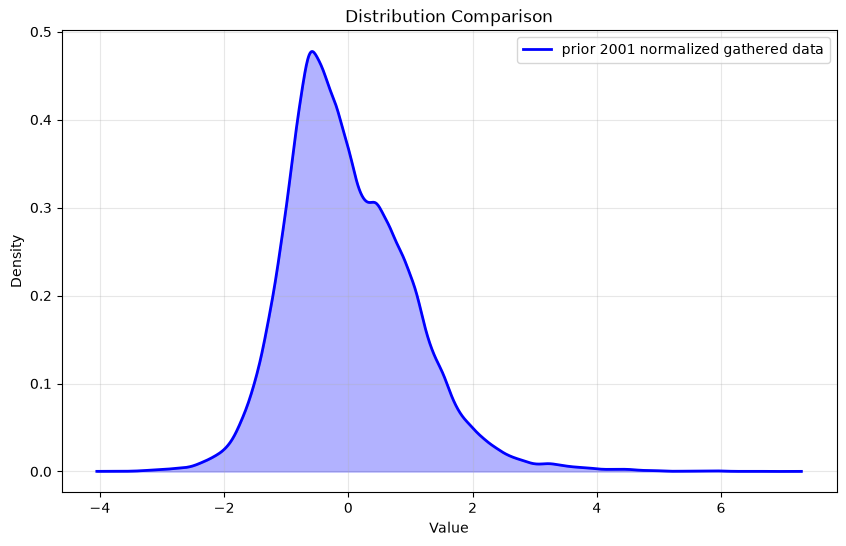

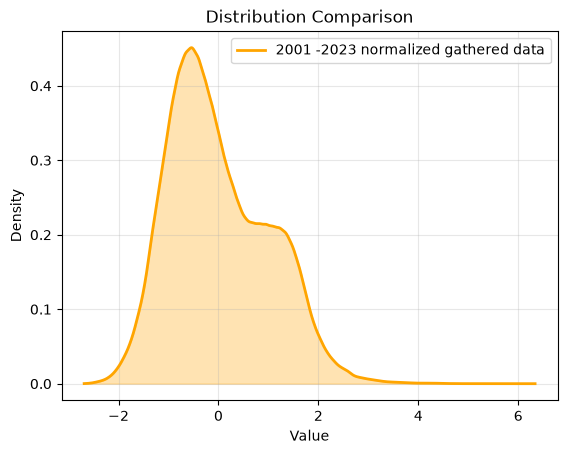

In [92]:
plt.figure(figsize=(10, 6))
for data, label, color in zip(
    [normal_pr2001, normal_aft2001],
    ['prior 2001 normalized gathered data', '2001 -2023 normalized gathered data'],
    ['blue', 'orange']
    ):
    density = scipy.stats.gaussian_kde(data)
    x_range = np.linspace(min(data), max(data), 1000)
    y_density = density(x_range)
    plt.plot(x_range, y_density, label=label, color=color, linewidth=2)
    plt.fill_between(x_range, y_density, alpha=0.3, color=color)
    plt.title('Distribution Comparison')
    plt.xlabel('Value')
    plt.ylabel('Density')
    plt.legend()
    plt.grid(True, alpha=0.3)
    plt.show()

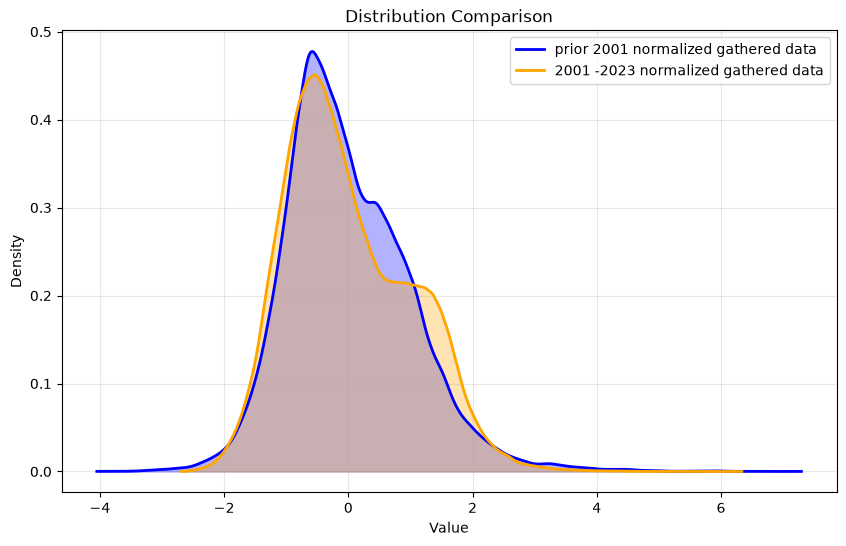

In [94]:
plt.figure(figsize=(10, 6))


density1 = scipy.stats.gaussian_kde(normal_pr2001)
x1 = np.linspace(min(normal_pr2001), max(normal_pr2001), 1000)
y1 = density1(x1)
plt.plot(x1, y1, label='prior 2001 normalized gathered data', color='blue', linewidth=2)
plt.fill_between(x1, y1, alpha=0.3, color='blue')


density2 = scipy.stats.gaussian_kde(normal_aft2001)
x2 = np.linspace(min(normal_aft2001), max(normal_aft2001), 1000)
y2 = density2(x2)
plt.plot(x2, y2, label='2001 -2023 normalized gathered data', color='orange', linewidth=2)
plt.fill_between(x2, y2, alpha=0.3, color='orange')

plt.title('Distribution Comparison')
plt.xlabel('Value')
plt.ylabel('Density')
plt.legend()
plt.grid(True, alpha=0.3)
plt.show()

In [ ]:

center_lat = E3['LAT'].mean()
center_lon = E3['LONG'].mean()


m = folium.Map(
    location=[center_lat, center_lon],
    zoom_start=6,
    tiles='OpenStreetMap'
)


sample_size = min(10000, len(E3))  
E3_sample = E3.sample(n=sample_size, random_state=42)

for idx, row in E3_sample.iterrows():
    folium.CircleMarker(
        location=[row['LAT'], row['LONG']],
        radius=2,
        color='red',
        fill=True,
        fillOpacity=0.6,
        popup=f"Magnitude: {row['MAGNITUDE']}<br>Date: {row['DATETIME']}"
    ).add_to(m)


m.save('earthquake_map.html')
m  

In [104]:
center_lat = subset1['LAT'].mean()
center_lon = subset1['LONG'].mean()


m2 = folium.Map(
    location=[center_lat, center_lon],
    zoom_start=6,
    tiles='OpenStreetMap'
)


sample_size = min(10000, len(subset1))  
E3_sample = subset1.sample(n=sample_size, random_state=42)

for idx, row in E3_sample.iterrows():
    folium.CircleMarker(
        location=[row['LAT'], row['LONG']],
        radius=2,
        color='red',
        fill=True,
        fillOpacity=0.6,
        popup=f"Magnitude: {row['MAGNITUDE']}<br>Date: {row['DATETIME']}"
    ).add_to(m2)


m2.save('earthquake_map.html')
m2  

In [102]:
subset3=pd.DataFrame({'DATETIME':(), 'LAT':(),'LONG':(),'DEPTH':(),'MAGNITUDE':(), 'YEAR':()})
for i in year_uniqe:
    subsets=E3[E3['YEAR']==i]
    subset3=pd.concat([subset3,subsets[subsets['MAGNITUDE']==max(subsets['MAGNITUDE'])]])

In [105]:
center_lat = subset3['LAT'].mean()
center_lon = subset3['LONG'].mean()


m3 = folium.Map(
    location=[center_lat, center_lon],
    zoom_start=6,
    tiles='OpenStreetMap'
)


sample_size = min(10000, len(subset3))  
E3_sample = subset3.sample(n=sample_size, random_state=42)

for idx, row in E3_sample.iterrows():
    folium.CircleMarker(
        location=[row['LAT'], row['LONG']],
        radius=2,
        color='red',
        fill=True,
        fillOpacity=0.6,
        popup=f"Magnitude: {row['MAGNITUDE']}<br>Date: {row['DATETIME']}"
    ).add_to(m3)


m3.save('earthquake_map.html')
m3  

In [111]:

E3.to_excel("E3.xlsx")
avg_by_month.to_excel("avg_by_month.xlsx")
avg_by_month2.to_excel("avg_by_month2.xlsx")
avg_by_day.to_excel("avg_by_day.xlsx")
avg_by_day2.to_excel("avg_by_day2.xlsx")
avg_by_year.to_excel("avg_by_year.xlsx")
avg_by_year2.to_excel("avg_by_year2.xlsx")
top10_magn_by_year.to_excel("top10_magn_by_year.xlsx")
top10_max_magn_by_year.to_excel("top10_max_magn_by_year.xlsx")

